# Group Presentation On Handling Missing Data and Anomly Detection

## This work was done by: 
### 1. Sahar Choukir
### 2. Mohammed Ba Salem
### 3. Mujtaba Ali Khan
### 4. Ekele Nnorom

# 1. Handling Missing Data

### Importing Relevant Libraries

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

# for classification
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

# to split and standarise the datasets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# to evaluate classification models
from sklearn.metrics import roc_auc_score

import sklearn.covariance
import sklearn.svm
import sklearn.ensemble
import sklearn.neighbors

import sklearn.datasets
from matplotlib import pyplot as plt
import time
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM
from sklearn.covariance import EllipticEnvelope


from pylab import rcParams
from sklearn.metrics import classification_report,accuracy_score
from sklearn.metrics import precision_recall_curve, roc_curve, auc
from sklearn.metrics import average_precision_score

import sklearn.covariance
import sklearn.svm
import sklearn.ensemble
import sklearn.neighbors

import sklearn.datasets
import pandas as pd 
import numpy as np

from matplotlib import pyplot as plt
import time

from sklearn.covariance import EllipticEnvelope
from pylab import rcParams
import warnings
warnings.filterwarnings('ignore')

Using TensorFlow backend.


In [2]:
# loading the Titanic Dataset with a few variables for demonstration

data = pd.read_csv('titanic.csv', usecols = ['Age', 'Fare', 'Survived'])
data.head()

,Survived,Age,Fare
0,0,22.0,7.2500
1,1,38.0,71.2833
2,1,26.0,7.9250
3,1,35.0,53.1000
4,0,35.0,8.0500


In [3]:
# let's look at the percentage of NA

data.isnull().mean()

Survived    0.000000
Age         0.198653
Fare        0.000000
dtype: float64

In [4]:
# let's separate into training and testing set

X_train, X_test, y_train, y_test = train_test_split(data, data.Survived, test_size=0.3,
                                                    random_state=0)
X_train.shape, X_test.shape

((623, 3), (268, 3))

In [5]:
X_train.head()

,Survived,Age,Fare
857,1,51.0,26.5500
52,1,49.0,76.7292
386,0,1.0,46.9000
124,0,54.0,77.2875
578,0,NaN,14.4583


## Imputation using the median and random imputation

In [6]:
# let's make a function to create 3 variables from Age:
# 1-e filling NA with median, 2- random sampling or 3- zeroes

def impute_na(df, variable, median):
    df[variable+'_median'] = df[variable].fillna(median)
    df[variable+'_zero'] = df[variable].fillna(0)
    
    # random sampling
    df[variable+'_random'] = df[variable]
    # extract the random sample to fill the na
    random_sample = X_train[variable].dropna().sample(df[variable].isnull().sum(), random_state=0)
    # pandas needs to have the same index in order to merge datasets
    random_sample.index = df[df[variable].isnull()].index
    df.loc[df[variable].isnull(), variable+'_random'] = random_sample

In [7]:
median = X_train.Age.mean()
median

29.915338645418327

In [8]:
impute_na(X_train, 'Age', median)
X_train.head(20)

,Survived,Age,Fare,Age_median,Age_zero,Age_random
857,1,51.0,26.5500,51.000000,51.0,51.0
52,1,49.0,76.7292,49.000000,49.0,49.0
386,0,1.0,46.9000,1.000000,1.0,1.0
124,0,54.0,77.2875,54.000000,54.0,54.0
578,0,NaN,14.4583,29.915339,0.0,16.0
549,1,8.0,36.7500,8.000000,8.0,8.0
118,0,24.0,247.5208,24.000000,24.0,24.0
12,0,20.0,8.0500,20.000000,20.0,20.0
157,0,30.0,8.0500,30.000000,30.0,30.0
127,1,24.0,7.1417,24.000000,24.0,24.0


In [9]:
impute_na(X_test, 'Age', median)
X_test.head()

,Survived,Age,Fare,Age_median,Age_zero,Age_random
495,0,NaN,14.4583,29.915339,0.0,16.0
648,0,NaN,7.5500,29.915339,0.0,32.0
278,0,7.0,29.1250,7.000000,7.0,7.0
31,1,NaN,146.5208,29.915339,0.0,34.0
255,1,29.0,15.2458,29.000000,29.0,29.0


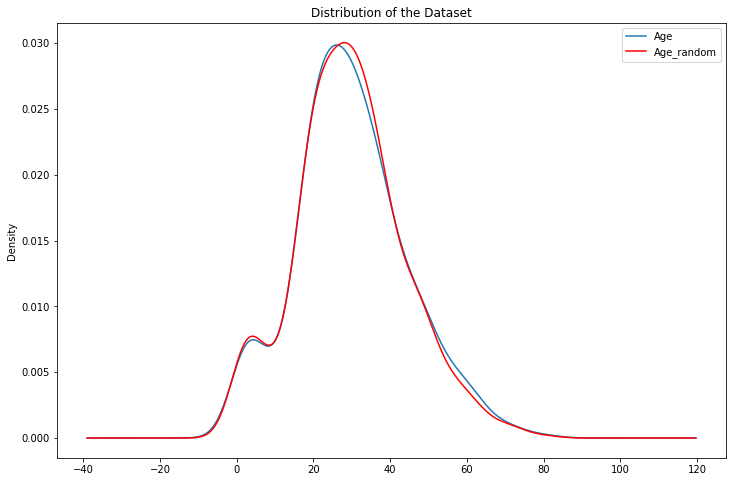

In [10]:
# we can see that the distribution of the variable after filling NA is exactly the same as that one before filling NA
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111)
X_train['Age'].plot(kind='kde', ax=ax)
X_train.Age_random.plot(kind='kde', ax=ax, color='red')
lines, labels = ax.get_legend_handles_labels()
plt.title('Distribution of the Dataset')
ax.legend(lines, labels, loc='best')

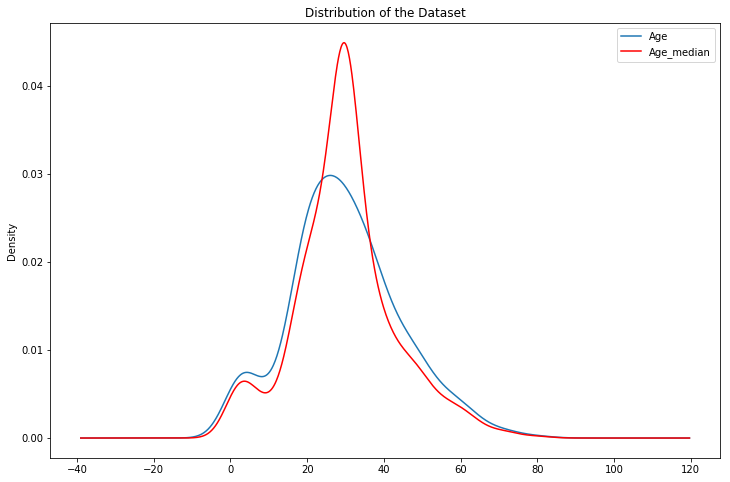

In [11]:
# we can see that the distribution has changed slightly with now more values accumulating in the median range
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111)
X_train['Age'].plot(kind='kde', ax=ax)
X_train.Age_median.plot(kind='kde', ax=ax, color='red')
lines, labels = ax.get_legend_handles_labels()
plt.title('Distribution of the Dataset')
ax.legend(lines, labels, loc='best')

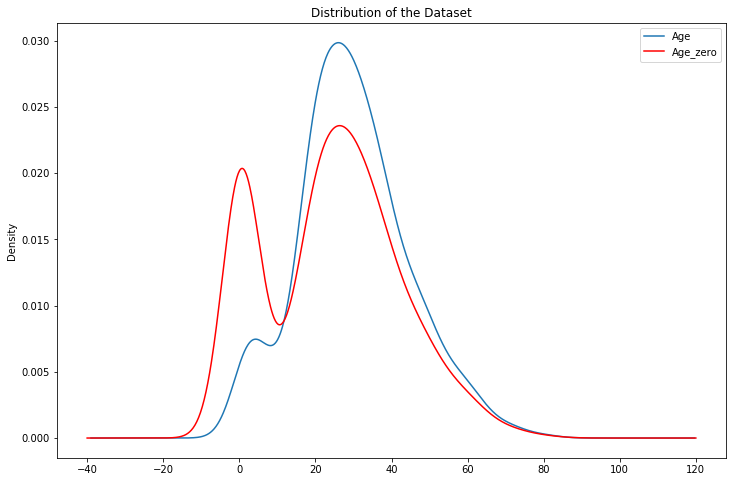

In [12]:
# filling NA with zeroes creates a peak of population around 0, as expected
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111)
X_train['Age'].plot(kind='kde', ax=ax)
X_train.Age_zero.plot(kind='kde', ax=ax, color='red')
lines, labels = ax.get_legend_handles_labels()
plt.title('Distribution of the Dataset')
ax.legend(lines, labels, loc='best')

### Logisitic Regression

In [13]:
# let's compare the performance of logistic regression on Age NA imputed by zeroes, or median or random sampling

logit = LogisticRegression(random_state=44, C=1000) # c big to avoid regularization
logit.fit(X_train[['Age_zero', 'Fare']], y_train)
print('Train set zero imputation')
pred = logit.predict_proba(X_train[['Age_zero', 'Fare']])
print('Logistic Regression roc-auc: {}'.format(roc_auc_score(y_train, pred[:,1])))
print('Test set zero imputation')
pred = logit.predict_proba(X_test[['Age_zero', 'Fare']])
print('Logistic Regression roc-auc: {}'.format(roc_auc_score(y_test, pred[:,1])))
print()
logit = LogisticRegression(random_state=44, C=1000) # c big to avoid regularization
logit.fit(X_train[['Age_median', 'Fare']], y_train)
print('Train set median imputation')
pred = logit.predict_proba(X_train[['Age_median', 'Fare']])
print('Logistic Regression roc-auc: {}'.format(roc_auc_score(y_train, pred[:,1])))
print('Test set median imputation')
pred = logit.predict_proba(X_test[['Age_median', 'Fare']])
print('Logistic Regression roc-auc: {}'.format(roc_auc_score(y_test, pred[:,1])))
print()
logit = LogisticRegression(random_state=44, C=1000) # c big to avoid regularization
logit.fit(X_train[['Age_random', 'Fare']], y_train)
print('Train set random sample imputation')
pred = logit.predict_proba(X_train[['Age_random', 'Fare']])
print('Logistic Regression roc-auc: {}'.format(roc_auc_score(y_train, pred[:,1])))
print('Test set random sample imputation')
pred = logit.predict_proba(X_test[['Age_random', 'Fare']])
print('Logistic Regression roc-auc: {}'.format(roc_auc_score(y_test, pred[:,1])))

Train set zero imputation
Logistic Regression roc-auc: 0.686346283160886
Test set zero imputation
Logistic Regression roc-auc: 0.71375

Train set median imputation
Logistic Regression roc-auc: 0.6789494804884926
Test set median imputation
Logistic Regression roc-auc: 0.7252380952380951

Train set random sample imputation
Logistic Regression roc-auc: 0.6851369818442117
Test set random sample imputation
Logistic Regression roc-auc: 0.7121130952380953


In [14]:
y_train.head()

857    1
52     1
386    0
124    0
578    0
Name: Survived, dtype: int64

Logistic Regression performed better with median and random sampling imputation, compared with replacing with zeroes. The caveat of randomness still applies.
However, there is the problem of randomness while using random imputation. As such, we seed the random state inorder to make the same predictions everytime

### Randomness can lead to different scores being assigned to the same observation

In [15]:
# let's pick one observation with NA in Age
observation = data[data.Age.isnull()].tail(1)
observation

,Survived,Age,Fare
888,0,NaN,23.45


In [16]:
# the seed is now the Fare
int(observation.Fare)

23

In [17]:
# we assign the Fare as the seed in the random sample extraction, hence the seed 
# now depends on another variable Fare in the dataset
obs_sample = X_train.Age.dropna().sample(1, random_state=int(observation.Fare))
obs_sample.index = [888]
observation['Age_random']=obs_sample
observation

,Survived,Age,Fare,Age_random
888,0,NaN,23.45,35.0


## Adding a variable to capture NA

In [18]:
# create variable indicating missingness

X_train['Age_NA'] = np.where(X_train['Age'].isnull(), 1, 0)
X_test['Age_NA'] = np.where(X_test['Age'].isnull(), 1, 0)

X_train.head()

,Survived,Age,Fare,Age_median,Age_zero,Age_random,Age_NA
857,1,51.0,26.5500,51.000000,51.0,51.0,0
52,1,49.0,76.7292,49.000000,49.0,49.0,0
386,0,1.0,46.9000,1.000000,1.0,1.0,0
124,0,54.0,77.2875,54.000000,54.0,54.0,0
578,0,NaN,14.4583,29.915339,0.0,16.0,1


In [19]:
# we can see that mean and median are similar. So I will replace with the median
X_train.Age.mean(), X_train.Age.median(),

(29.915338645418327, 29.0)

In [20]:
# let's replace the NA with the median value in the training set
X_train['Age'].fillna(X_train.Age.median(), inplace=True)
X_test['Age'].fillna(X_train.Age.median(), inplace=True)

X_train.head(20)

,Survived,Age,Fare,Age_median,Age_zero,Age_random,Age_NA
857,1,51.0,26.5500,51.000000,51.0,51.0,0
52,1,49.0,76.7292,49.000000,49.0,49.0,0
386,0,1.0,46.9000,1.000000,1.0,1.0,0
124,0,54.0,77.2875,54.000000,54.0,54.0,0
578,0,29.0,14.4583,29.915339,0.0,16.0,1
549,1,8.0,36.7500,8.000000,8.0,8.0,0
118,0,24.0,247.5208,24.000000,24.0,24.0,0
12,0,20.0,8.0500,20.000000,20.0,20.0,0
157,0,30.0,8.0500,30.000000,30.0,30.0,0
127,1,24.0,7.1417,24.000000,24.0,24.0,0


### Logistic Regression

In [21]:

"""
scaler = StandardScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train))
X_test = pd.DataFrame(scaler.transform(X_test))
"""
y_train.head()

857    1
52     1
386    0
124    0
578    0
Name: Survived, dtype: int64

In [22]:
# we compare the models built using Age filled with median, vs Age filled with median + additional
# variable indicating missingness

logit = LogisticRegression(random_state=44, C=1000) # c big to avoid regularization
logit.fit(X_train[['Age','Fare']], y_train)
print('Train set')
pred = logit.predict_proba(X_train[['Age','Fare']])
print('Logistic Regression roc-auc: {}'.format(roc_auc_score(y_train, pred[:,1])))
print('Test set')
pred = logit.predict_proba(X_test[['Age','Fare']])
print('Logistic Regression roc-auc: {}'.format(roc_auc_score(y_test, pred[:,1])))

logit = LogisticRegression(random_state=44, C=1000) # c big to avoid regularization
logit.fit(X_train[['Age','Age_NA', 'Fare']], y_train)
print('Train set')
pred = logit.predict_proba(X_train[['Age','Age_NA', 'Fare']])
print('Logistic Regression roc-auc: {}'.format(roc_auc_score(y_train, pred[:,1])))
print('Test set')
pred = logit.predict_proba(X_test[['Age','Age_NA', 'Fare']])
print('Logistic Regression roc-auc: {}'.format(roc_auc_score(y_test, pred[:,1])))

Train set
Logistic Regression roc-auc: 0.6795188824537429
Test set
Logistic Regression roc-auc: 0.7244940476190477
Train set
Logistic Regression roc-auc: 0.6762705798138868
Test set
Logistic Regression roc-auc: 0.7167857142857142


### Hot Deck

In [23]:
data = pd.read_csv('titanic.csv', usecols = ['Age', 'Fare', 'Survived'])
data.head()

,Survived,Age,Fare
0,0,22.0,7.2500
1,1,38.0,71.2833
2,1,26.0,7.9250
3,1,35.0,53.1000
4,0,35.0,8.0500


In [24]:
# let's look at the percentage of NA

data.isnull().mean()

Survived    0.000000
Age         0.198653
Fare        0.000000
dtype: float64

In [25]:
# fill in the data with a similar value in the sample, in this case, previous day's weather
data.fillna(method = 'ffill')

,Survived,Age,Fare
0,0,22.0,7.2500
1,1,38.0,71.2833
2,1,26.0,7.9250
3,1,35.0,53.1000
4,0,35.0,8.0500
5,0,35.0,8.4583
6,0,54.0,51.8625
7,0,2.0,21.0750
8,1,27.0,11.1333
9,1,14.0,30.0708


### Linear Regression

In [26]:
data = pd.read_csv('titanic.csv', usecols = ['Age', 'Fare', 'Survived'])
data.head()

,Survived,Age,Fare
0,0,22.0,7.2500
1,1,38.0,71.2833
2,1,26.0,7.9250
3,1,35.0,53.1000
4,0,35.0,8.0500


In [27]:
# fill in the data with a linear guess
data.interpolate()
data.head()

,Survived,Age,Fare
0,0,22.0,7.2500
1,1,38.0,71.2833
2,1,26.0,7.9250
3,1,35.0,53.1000
4,0,35.0,8.0500


In [28]:
# fill in the data with a quadratic guess
data.interpolate(method='quadratic')
data.head()

,Survived,Age,Fare
0,0,22.0,7.2500
1,1,38.0,71.2833
2,1,26.0,7.9250
3,1,35.0,53.1000
4,0,35.0,8.0500


In [29]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

# for regression problems
from sklearn.linear_model import LinearRegression, Ridge

# to split and standarize the datasets
from sklearn.model_selection import train_test_split

# to evaluate regression models
from sklearn.metrics import mean_squared_error

import warnings
warnings.filterwarnings('ignore')

## 1.2 Missing Values in Categorical Varibles

Like imputation of missing values in numerical varibles, categorical variables also contain missing values NaN, but they are in term of words or text. There are a lot of methods to imputate missing data in categorical varibles,however, two methods will be introduced in this section. 
1. The Frequent Category Imputation. 
2. Random Sample Imputation. 

### 1.2.1 The frequent category Imputation

Imputation by frequent category means that missing value NaN will be replaced by the most frequent category/label of that varible.

**Assumption**: The data are missing completely at random (MCAR). That means value to be filled is most likely the most frequent category. 

**Note**: From the dataset of house prices, we only select four columns of interest to explain the concept of categorical imputation. 

In [30]:
# Loading the dataset and specific columns to be used for the purpose of explaination
columns_used= ['GarageQual', 'FireplaceQu', 'BsmtCond', 'SalePrice']
# Creating data with specified columns 
data = pd.read_csv('house_prices_train.csv', usecols =columns_used)
data.head(10)


,SalePrice,BsmtCond,FireplaceQu,GarageQual
0,169277.0525,TA,NaN,TA
1,187758.3940,TA,TA,TA
2,183583.6836,TA,TA,TA
3,179317.4775,Gd,Gd,TA
4,150730.0800,TA,TA,TA
5,177150.9892,TA,NaN,TA
6,172070.6592,TA,Gd,TA
7,175110.9565,TA,TA,TA
8,162011.6988,TA,TA,Fa
9,160726.2478,TA,TA,Gd


In [31]:
# Checking the persentage of missing values for the purpose of visualization. 
data.isnull().mean().sort_values(ascending=True)

SalePrice      0.000685
BsmtCond       0.025342
GarageQual     0.055479
FireplaceQu    0.472603
dtype: float64

From above percentage, the varible Fireplace Quality contains about half of data are NaN, threfore, replacing these missing values with most frequent categorical varible will lead to distorate relatioship of the most frequent category with sale price. 

On the other hand, the varibles Basment Quality and Garage Quality contains very low percentage of missing values, thus replacing these values with the most frequent category will not distorate the relationship of most frequent category with sale price.  

In [32]:
# Splitting data set into 70% training and 30% testing
X_train, X_test, y_train, y_test = train_test_split(data[['GarageQual', 'FireplaceQu', 'BsmtCond']],
                                                    data.SalePrice, test_size=0.3,
                                                    random_state=0)
X_train.shape, X_test.shape

((1022, 3), (438, 3))

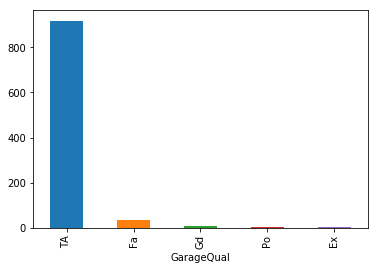

In [33]:
# checking the frequency of each labels in different variable
#1.checking the frequency of each lable in Garage Type
X_train.groupby(['GarageQual'])['GarageQual'].count().sort_values(ascending=False).plot.bar()

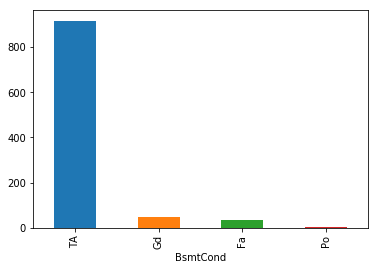

In [34]:
#2.checking the frequency of each lable in Basment Quality
X_train.groupby(['BsmtCond'])['BsmtCond'].count().sort_values(ascending=False).plot.bar()

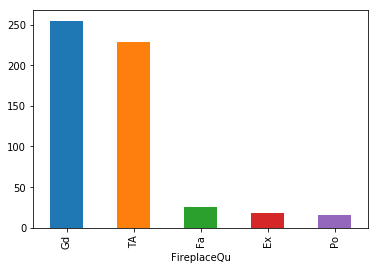

In [35]:
#3.checking the frequency of each lable in Fire Place Type
X_train.groupby(['FireplaceQu'])['FireplaceQu'].count().sort_values(ascending=False).plot.bar()

In [36]:
# with this command we capture the most frequent label (check output with plot above)
#X_train.groupby(['GarageQual'])['GarageQual'].count().sort_values(ascending=False).index[0]

In [37]:
# Displaying training set 
X_train.head(10)

,GarageQual,FireplaceQu,BsmtCond
64,TA,NaN,TA
682,TA,Gd,TA
960,NaN,NaN,TA
1384,TA,NaN,TA
1100,TA,NaN,Fa
416,TA,TA,TA
1034,Fa,Gd,Fa
853,TA,Fa,TA
472,TA,NaN,TA
1011,NaN,NaN,NaN


In [38]:
# Calculating number of missing values NaN in training set
X_train.isnull().sum()

GarageQual      54
FireplaceQu    478
BsmtCond        24
dtype: int64

In [39]:
# Displaying testing set 
X_test.head(10)

,GarageQual,FireplaceQu,BsmtCond
529,TA,TA,TA
491,TA,TA,TA
459,TA,TA,TA
279,TA,TA,TA
655,TA,NaN,TA
1013,TA,NaN,TA
1403,TA,NaN,TA
601,TA,Gd,TA
1182,TA,TA,TA
687,TA,NaN,TA


In [40]:
# Calculating number of missing values NaN in testing set
X_test.isnull().sum()

GarageQual      27
FireplaceQu    212
BsmtCond        13
dtype: int64

In [41]:
# Defining a finction that replace the NaN with the most frequent category in the training and testing 
def Imputate_NaN(dtf_training, dtf_testing, variable):
    #1. Get the most frequent category from training data
    frequent_category = dtf_training.groupby([variable])[variable].count().sort_values(ascending=False).index[0]
    #2.Create a new varible, copy original data and fill it with most frequent category found above for training set.
    dtf_training[variable].fillna(frequent_category, inplace=True)
    #3.Create a new varible, copy original data and fill it with most frequent category found above for test set.
    dtf_testing[variable].fillna(frequent_category, inplace=True)

In [42]:
# crating a for loop to replace Nan with the most frequent category
for variable in ['GarageQual', 'FireplaceQu', 'BsmtCond']:
    Imputate_NaN(X_train, X_test, variable)

In [43]:
# Displaying training set after imputation
X_train.head(10)

,GarageQual,FireplaceQu,BsmtCond
64,TA,Gd,TA
682,TA,Gd,TA
960,TA,Gd,TA
1384,TA,Gd,TA
1100,TA,Gd,Fa
416,TA,TA,TA
1034,Fa,Gd,Fa
853,TA,Fa,TA
472,TA,Gd,TA
1011,TA,Gd,TA


In [44]:
# calculating & checking number of missing values NaN in training set after imputation
X_train.isnull().sum()


GarageQual     0
FireplaceQu    0
BsmtCond       0
dtype: int64

In [45]:
# Displaying testing set after imputation
X_test.head(10)

,GarageQual,FireplaceQu,BsmtCond
529,TA,TA,TA
491,TA,TA,TA
459,TA,TA,TA
279,TA,TA,TA
655,TA,Gd,TA
1013,TA,Gd,TA
1403,TA,Gd,TA
601,TA,Gd,TA
1182,TA,TA,TA
687,TA,Gd,TA


In [46]:
# Calculating number of missing values NaN in testing set after imputation
X_test.isnull().sum()

GarageQual     0
FireplaceQu    0
BsmtCond       0
dtype: int64

### 1.2.2 Random Sample Imputation 
Imputation is firstly done on the training set, then it propogate into the testing set. That means we will collect random samples from the training set and then use them to replace NaN in both the training and test sets as well. 

Imputation by random sample is another method to fill in missing values. This technique mainly depends on taking a random observation from a pool of avilable observations in category. Then by using the randomly extracted value to fill NaN. 

**Assumption**: The data are missing completely at random (MCAR). That means value to be filled is most likely from the pool of the most frequent category where we will not change original distribution. 

In [47]:
# Splitting the dataset into 70% training and 30% testing 
X_train1, X_test1, y_train1, y_test1 = train_test_split(data[['GarageQual', 'FireplaceQu', 'BsmtCond']],
                                                    data.SalePrice,
                                                    test_size=0.3,
                                                    random_state=0)
# The seed above set to zero for reproduceability, so everytime we run the code, we have the same split. 
X_train1.shape, X_test1.shape

((1022, 3), (438, 3))

In [48]:
# Checking the persentage of missing values for the purpose of visualization. 
data.isnull().mean().sort_values(ascending=True)

SalePrice      0.000685
BsmtCond       0.025342
GarageQual     0.055479
FireplaceQu    0.472603
dtype: float64

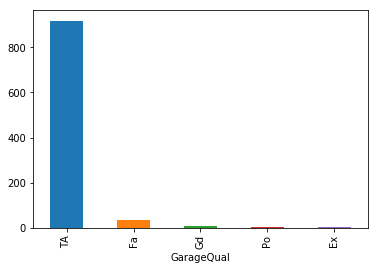

In [49]:
# checking the frequency of each labels in different variable
#1.checking the frequency of each lable in Garage Type
X_train1.groupby(['GarageQual'])['GarageQual'].count().sort_values(ascending=False).plot.bar()

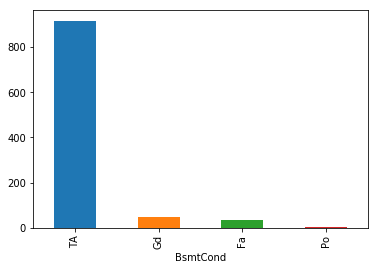

In [50]:
#2.checking the frequency of each lable in Basment Quality
X_train1.groupby(['BsmtCond'])['BsmtCond'].count().sort_values(ascending=False).plot.bar()

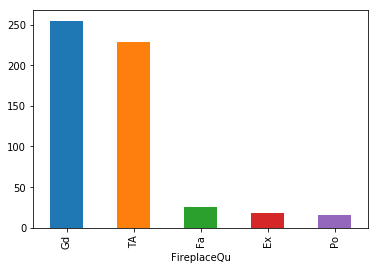

In [51]:
#3.checking the frequency of each lable in Fire Place Type
X_train1.groupby(['FireplaceQu'])['FireplaceQu'].count().sort_values(ascending=False).plot.bar()

In [52]:
# Displaying training set 
X_train1.head(10)

,GarageQual,FireplaceQu,BsmtCond
64,TA,NaN,TA
682,TA,Gd,TA
960,NaN,NaN,TA
1384,TA,NaN,TA
1100,TA,NaN,Fa
416,TA,TA,TA
1034,Fa,Gd,Fa
853,TA,Fa,TA
472,TA,NaN,TA
1011,NaN,NaN,NaN


In [53]:
# Calculating number of missing values NaN in training set
X_train1.isnull().sum()

GarageQual      54
FireplaceQu    478
BsmtCond        24
dtype: int64

In [54]:
# Displaying testing set 
X_test1.head(10)

,GarageQual,FireplaceQu,BsmtCond
529,TA,TA,TA
491,TA,TA,TA
459,TA,TA,TA
279,TA,TA,TA
655,TA,NaN,TA
1013,TA,NaN,TA
1403,TA,NaN,TA
601,TA,Gd,TA
1182,TA,TA,TA
687,TA,NaN,TA


In [55]:
# Calculating number of missing values NaN in training set
X_train1.isnull().sum()

GarageQual      54
FireplaceQu    478
BsmtCond        24
dtype: int64

In [56]:
# Calculating number of missing values NaN in testing set
X_test1.isnull().sum()

GarageQual      27
FireplaceQu    212
BsmtCond        13
dtype: int64

In [57]:
# Defining a function to fill NaN missing data with random samples with most frequent category  

def Impute_Nan_random(dtf_training, dtf_testing, variable):
    #The below lines, will look into each category's labels and replace missing data in both train and test data
    #1. Get the most frequent category from training data
    frequent_category_rand = dtf_training.groupby([variable])[variable].count().sort_values(ascending=False).index[0]
    #2.Create a new varible, copy original data and fill it with most frequent category found above for training set.
    dtf_training[variable+'_Freq'] = dtf_training[variable].fillna(frequent_category_rand)
    #3.Create a new varible, copy original data and fill it with most frequent category found above for test set.
    dtf_testing[variable+'_Freq'] = dtf_testing[variable].fillna(frequent_category_rand)
    
    # Random sampling process
    #1. Create a new varible and copy original values which contains missing values NaN from training set
    dtf_training[variable+'_Rand'] = dtf_training[variable]
    #2. Create a new varible and copy original values which contains missing values NaN from testing set
    dtf_testing[variable+'_Rand'] = dtf_testing[variable]
    
    # Creating a pool of samples and extract random sample to fill the NaN
    #1.Creat a training sample by first drop NaN,indicate the amount of observations to take randomly by passing number of NaN in training set
    training_sample_rand = dtf_training[variable].dropna().sample(dtf_training[variable].isnull().sum(), random_state=0)
    #2.Creat a training sample by first drop NaN,indicate the amount of observations to take randomly by passing number of NaN in test set
    testing_sample_rand = dtf_training[variable].dropna().sample(dtf_testing[variable].isnull().sum(), random_state=0)
    
    #Indicating the index of observation which will be replaced by random sample, this is only in Panadas
    training_sample_rand.index = dtf_training[dtf_training[variable].isnull()].index
    testing_sample_rand.index = dtf_testing[dtf_testing[variable].isnull()].index
    
    #Replacing missing values with randomly extracted ones
    dtf_training.loc[dtf_training[variable].isnull(), variable+'_Rand'] = training_sample_rand
    dtf_testing.loc[dtf_testing[variable].isnull(), variable+'_Rand'] = testing_sample_rand

In [58]:
# and let's replace the NA
for variable in ['GarageQual', 'FireplaceQu', 'BsmtCond']:
    Impute_Nan_random(X_train1, X_test1, variable)

In [59]:
# Displaying training set after imputation
X_train1.head(10)

,GarageQual,FireplaceQu,BsmtCond,GarageQual_Freq,GarageQual_Rand,FireplaceQu_Freq,FireplaceQu_Rand,BsmtCond_Freq,BsmtCond_Rand
64,TA,NaN,TA,TA,TA,Gd,Gd,TA,TA
682,TA,Gd,TA,TA,TA,Gd,Gd,TA,TA
960,NaN,NaN,TA,TA,TA,Gd,TA,TA,TA
1384,TA,NaN,TA,TA,TA,Gd,TA,TA,TA
1100,TA,NaN,Fa,TA,TA,Gd,Gd,Fa,Fa
416,TA,TA,TA,TA,TA,TA,TA,TA,TA
1034,Fa,Gd,Fa,Fa,Fa,Gd,Gd,Fa,Fa
853,TA,Fa,TA,TA,TA,Fa,Fa,TA,TA
472,TA,NaN,TA,TA,TA,Gd,Gd,TA,TA
1011,NaN,NaN,NaN,TA,TA,Gd,Gd,TA,TA


In [60]:
# Calculating and checking number of missing values in training set after imputation.
X_train1.isnull().sum()

GarageQual           54
FireplaceQu         478
BsmtCond             24
GarageQual_Freq       0
GarageQual_Rand       0
FireplaceQu_Freq      0
FireplaceQu_Rand      0
BsmtCond_Freq         0
BsmtCond_Rand         0
dtype: int64

In [61]:
# Displaying training set after imputation
X_test1.head(10)

,GarageQual,FireplaceQu,BsmtCond,GarageQual_Freq,GarageQual_Rand,FireplaceQu_Freq,FireplaceQu_Rand,BsmtCond_Freq,BsmtCond_Rand
529,TA,TA,TA,TA,TA,TA,TA,TA,TA
491,TA,TA,TA,TA,TA,TA,TA,TA,TA
459,TA,TA,TA,TA,TA,TA,TA,TA,TA
279,TA,TA,TA,TA,TA,TA,TA,TA,TA
655,TA,NaN,TA,TA,TA,Gd,Gd,TA,TA
1013,TA,NaN,TA,TA,TA,Gd,TA,TA,TA
1403,TA,NaN,TA,TA,TA,Gd,TA,TA,TA
601,TA,Gd,TA,TA,TA,Gd,Gd,TA,TA
1182,TA,TA,TA,TA,TA,TA,TA,TA,TA
687,TA,NaN,TA,TA,TA,Gd,Gd,TA,TA


In [62]:
# Calculating and checking number of missing values in training set after imputation.
X_test1.isnull().sum()

GarageQual           27
FireplaceQu         212
BsmtCond             13
GarageQual_Freq       0
GarageQual_Rand       0
FireplaceQu_Freq      0
FireplaceQu_Rand      0
BsmtCond_Freq         0
BsmtCond_Rand         0
dtype: int64

In [63]:
X_train.head()

,GarageQual,FireplaceQu,BsmtCond
64,TA,Gd,TA
682,TA,Gd,TA
960,TA,Gd,TA
1384,TA,Gd,TA
1100,TA,Gd,Fa


### 1.2.3 Results and Discussion

The following two tables shows the difference between most frequent catgory method and random sampling. Here we only present a samll portion of imputated data for column of Fire Quality (Original), Fire Quality Frequent (most frequent category), Fire Quality Random (random sampling category).


In [64]:
#Displaying certain data of overall to compare two methods and showing distoration 
X_train1[['FireplaceQu','FireplaceQu_Freq','FireplaceQu_Rand']].head(10)

,FireplaceQu,FireplaceQu_Freq,FireplaceQu_Rand
64,NaN,Gd,Gd
682,Gd,Gd,Gd
960,NaN,Gd,TA
1384,NaN,Gd,TA
1100,NaN,Gd,Gd
416,TA,TA,TA
1034,Gd,Gd,Gd
853,Fa,Fa,Fa
472,NaN,Gd,Gd
1011,NaN,Gd,Gd


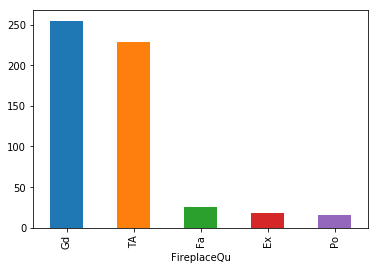

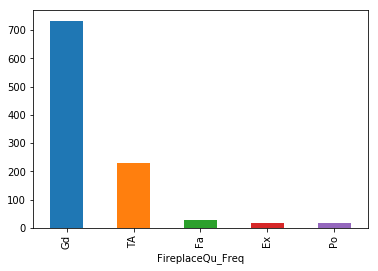

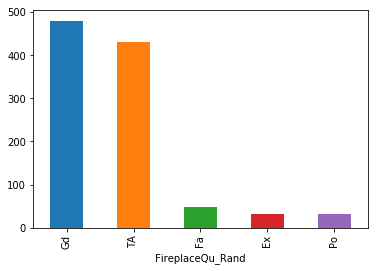

In [65]:
# displaying the results from imputation from two methods to observe the distoration
for x in ['FireplaceQu', 'FireplaceQu_Freq', 'FireplaceQu_Rand']:
    X_train1.groupby([x])[x].count().sort_values(ascending=False).plot.bar()
    plt.show()

From the above table and plots we observe the following: 
- Most frequent category approach distorate the relationship of most frequent label with other varibles within the dataset.  
- Most frequent category approach may lead to an over-representation of the most frequent label if there is a big number of NaN
- Random sample imputation preserve the frequency of the different categories or labels within the variable, so within this data there is no distoration within relationship.


# 2. Anomaly Detection

## Variables Initialization

This dataset was obtained from Scikit-learn library. There are 300 data points for each type of datasets, 15% of them are outliers. Reference: https://scikit-learn.org/stable/auto_examples/plot_anomaly_comparison.html#sphx-glr-auto-examples-plot-anomaly-comparison-py

In [66]:
# Number of training data points
n_samples = 300
# 15% of the training data (45 of them) are outliers
outliers_fraction = 0.15
# Calculate the number of inliers and outliers
n_outliers = int(outliers_fraction * n_samples)
n_inliers = n_samples - n_outliers

# In our dataset, there are 120 testing samples (40% of total dataset)
test_samples = int(n_samples * 0.4)
# 18 of them are outliers
test_outliers = int(outliers_fraction * test_samples)
# 102 of them are inliers
test_inliers = test_samples - test_outliers

Define a meshgrid for the counter plot.

In [67]:
# We first characterize a meshgrid and let the model predit every single point on this meshgrid
# Next, we can get the area where the model predicts that the inliers exist which will allow us to plot and visualize the boundary of this area.
xx, yy = np.meshgrid(np.linspace(-7, 7, 150), np.linspace(-7, 7, 150))


Define a color array for scatter plot.

In [68]:
# For distinguishing the inliers and outliers on the plot
colors = np.array(['#fffff0', '#ff7f50'])
# colors = np.array(['#377eb8', '#ff7f00'])

## Generate Training Datasets

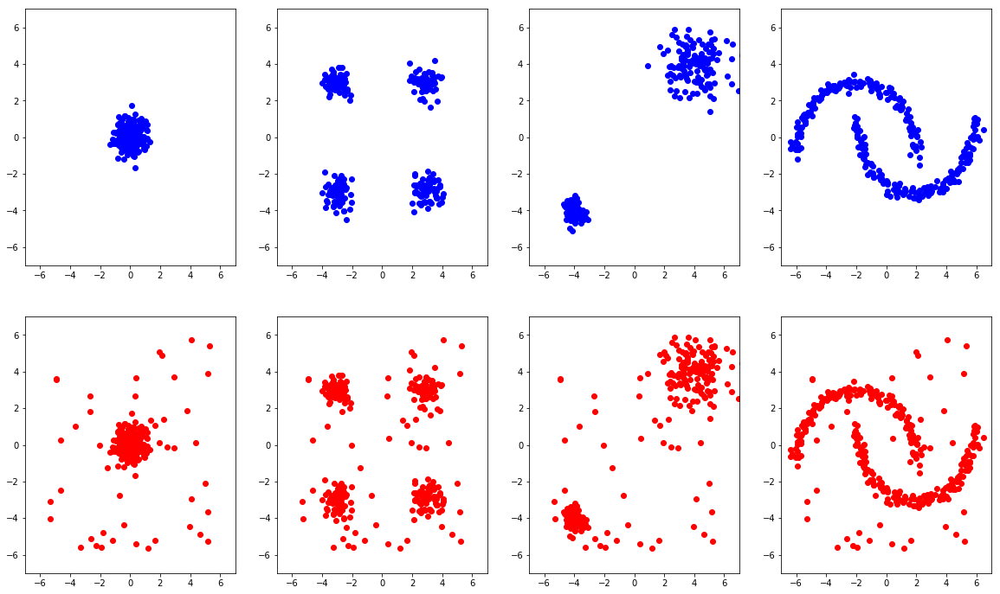

In [69]:
# We generate 45 random noise datapoints
noise1 = np.random.uniform(low=-6, high=6, size=(n_outliers, 2))

# We then create 4 types of datasets (one for each technique)
# First dataset has only one cluster of data points, and the data points follow a normal distribution
X1 = sklearn.datasets.make_blobs(centers=[[0, 0], [0, 0]], cluster_std=0.5, n_samples=n_inliers)[0]
# Second dataset has 4 clusters of data with the same standard deviation and each group follows normal distribution
X2 = sklearn.datasets.make_blobs(centers=[[3, 3], [-3, -3], [3, -3], [-3, 3]], cluster_std=[0.5, 0.5, 0.5, 0.5], n_samples=n_inliers)[0]
# Third dataset has 2 clusters of data with different standard deviation and each group follows a normal distribution
X3 = sklearn.datasets.make_blobs(centers=[[4, 4], [-4, -4]], cluster_std=[1., .3], n_samples=n_inliers)[0]
# Fourth dataset has 2 clusters of data that are not normally distributed
X4 = 4. * (sklearn.datasets.make_moons(n_samples=n_samples, noise=.05, random_state=0)[0] - np.array([0.5, 0.25]))

# Then these datasets are combined with the generated noise
X_wnoise = np.array([np.r_[X1, noise1],np.r_[X2, noise1],np.r_[X3, noise1],np.r_[X4, noise1]])

# A clean dataset is kept for Novelty detection
X_nonoise = np.array([X1, X2, X3, X4])

# Plotting the datasets
plt.figure(figsize=(20, 12))
for i in range(len(X_nonoise)):
    plt.subplot(2,4,i+1)
    plt.scatter(X_nonoise[i][:,0],X_nonoise[i][:,1], c='blue')
    plt.xlim(-7, 7)
    plt.ylim(-7, 7)
    
    plt.subplot(2,4,i+5)
    plt.scatter(X_wnoise[i][:,0],X_wnoise[i][:,1], c='red')
    plt.xlim(-7, 7)
    plt.ylim(-7, 7)
plt.show()



## Generate Testing Data

We then generate some testing data using similar logic.

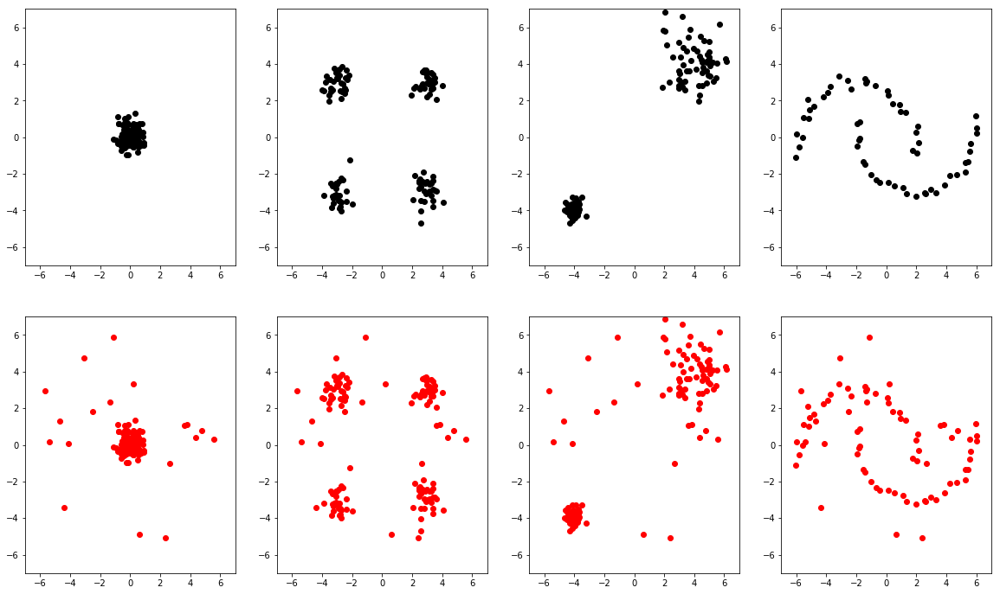

In [70]:
# Noise for Testing Data
noise2 = np.random.uniform(low=-6, high=6, size=(test_outliers, 2))

# Creating the data clusters
X1 = sklearn.datasets.make_blobs(centers=[[0, 0], [0, 0]], cluster_std=0.5,n_samples=test_samples)[0]
X2 = sklearn.datasets.make_blobs(centers=[[3, 3], [-3, -3], [3, -3], [-3, 3]], cluster_std=[0.5, 0.5, 0.5, 0.5], n_samples=test_samples)[0]
X3 = sklearn.datasets.make_blobs(centers=[[4, 4], [-4, -4]], cluster_std=[1, .3], n_samples=test_samples)[0]
X4 = 4. * (sklearn.datasets.make_moons(n_samples=60, noise=.05, random_state=0)[0] - np.array([0.5, 0.25]))
X_test = np.array([np.r_[X1, noise2],np.r_[X2, noise2],np.r_[X3, noise2],np.r_[X4, noise2]])
X_test_nonoise = np.array([X1, X2, X3, X4])

# Plotting the datasets
plt.figure(figsize=(20, 12))
for i in range(len(X_test_nonoise)):
    plt.subplot(2,4,i+1)
    plt.scatter(X_test_nonoise[i][:,0],X_test_nonoise[i][:,1], c='black')
    plt.xlim(-7, 7)
    plt.ylim(-7, 7)
    
    plt.subplot(2,4,i+5)
    plt.scatter(X_test[i][:,0],X_test[i][:,1], c='red')
    plt.xlim(-7, 7)
    plt.ylim(-7, 7)
    
plt.show()



# Outlier Detection

In our case, training datasets have been contaminated by outliers. Our goal is to fit a boundary to the inliers and use this result to do predictions (i.e. determine whether a new data is an inlier or an outlier). 

## Robust Covariance Method (Elliptic Envelope Method)

Robust Covariance Method assumes the data follows a known distribution and fits ONLY ONE ellipse to the boundary of ALL the inliers. It has the best result if the data has only one cluster and is Gaussian distributed but not that well on those datasets which have multiple clusters of data points.

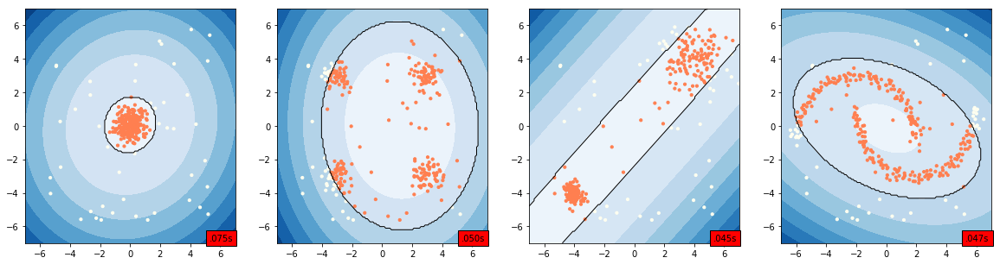

In [71]:
# Setup the Robust Covariance (Elliptic Envelope)
algorithm = sklearn.covariance.EllipticEnvelope(contamination=outliers_fraction)

plt.figure(figsize=(20, 5))
for i in range(len(X_wnoise)):
    plt.subplot(1,4,i+1)
    
    # Training the model and counting the time elapsed
    t0 = time.time()
    algorithm.fit(X_wnoise[i])
    t1 = time.time()
    
    # Using the model to do predictions on the training dataset
    y_pred = algorithm.predict(X_wnoise[i])
    
    # Highlighting the inlier boundary 
    boundary = algorithm.predict(np.c_[xx.ravel(), yy.ravel()])
    boundary = boundary.reshape(xx.shape)
    plt.contour(xx, yy, boundary, levels=[0], linewidths=1, colors='#000000')
    
    # Plotting results of the decision function (i.e, probability distribution of the inliers)
    decision = algorithm.decision_function(np.c_[xx.ravel(), yy.ravel()])
    decision = decision.reshape(xx.shape)
    plt.contourf(xx, yy, decision, cmap=plt.cm.Blues_r)

    # Plotting the color-coded dataset
    plt.scatter(X_wnoise[i][:, 0], X_wnoise[i][:, 1], s=10, color=colors[(y_pred + 1) // 2])
    plt.xlim(-7, 7)
    plt.ylim(-7, 7)
    
    # Displaying time elapsed in training the dataset
    plt.text(.99, .01, ('%.3fs' % (t1 - t0)).lstrip('0'), transform=plt.gca().transAxes, size=10, horizontalalignment='right',bbox=dict(facecolor='red'))
    
    

## One-Class Support Vector Machine (SVM)

One-Class SVM is very susceptible/sensitive to outliers and thus is not recommended for outlier detection. It is more suited for novelty detection, which requires that the training dataset be without any outliers. 

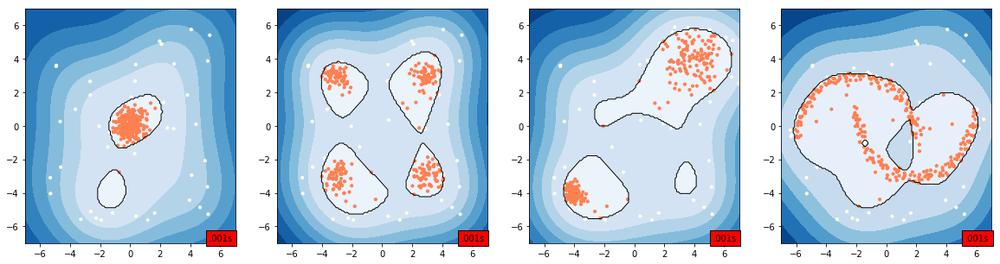

In [72]:
# Setup the One-Class Support Vector Machine
algorithm = sklearn.svm.OneClassSVM(nu=outliers_fraction, kernel="rbf", gamma=0.1)

plt.figure(figsize=(20, 5))
for i in range(len(X_wnoise)):
    plt.subplot(1,4,i+1)
    
    t0 = time.time()
    algorithm.fit(X_wnoise[i])
    t1 = time.time()
    
    y_pred = algorithm.fit(X_wnoise[i]).predict(X_wnoise[i])

    boundary = algorithm.predict(np.c_[xx.ravel(), yy.ravel()])
    boundary = boundary.reshape(xx.shape)
    plt.contour(xx, yy, boundary, levels=[0], linewidths=1, colors='#000000')
    
    decision = algorithm.decision_function(np.c_[xx.ravel(), yy.ravel()])
    decision = decision.reshape(xx.shape)
    plt.contourf(xx, yy, decision, cmap=plt.cm.Blues_r)

    plt.scatter(X_wnoise[i][:, 0], X_wnoise[i][:, 1], s=10, color=colors[(y_pred + 1) // 2])
    
    plt.xlim(-7, 7)
    plt.ylim(-7, 7)
    plt.text(.99, .01, ('%.3fs' % (t1 - t0)).lstrip('0'), transform=plt.gca().transAxes, size=10, horizontalalignment='right',bbox=dict(facecolor='red'))
    


## Isolation Forest

This technique converts datasets into one or multi-dimensional feature space by computing a threshold between the max/min value of the features. The number of splits referred to as the isolation number allows to isolate an outlier and identify the different clusters. 

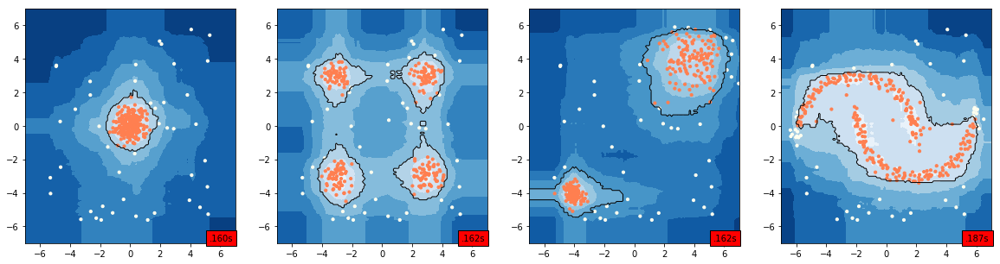

In [73]:
# Setup the isolation forest
algorithm = sklearn.ensemble.IsolationForest(contamination=outliers_fraction, behaviour="new")

plt.figure(figsize=(20, 5))
for i in range(len(X_wnoise)):
    plt.subplot(1,4,i+1)
    
    t0 = time.time()
    algorithm.fit(X_wnoise[i])
    t1 = time.time()
    
    y_pred = algorithm.fit(X_wnoise[i]).predict(X_wnoise[i])

    boundary = algorithm.predict(np.c_[xx.ravel(), yy.ravel()])
    boundary = boundary.reshape(xx.shape)
    plt.contour(xx, yy, boundary, levels=[0], linewidths=1, colors='#000000')
    
    decision = algorithm.decision_function(np.c_[xx.ravel(), yy.ravel()])
    decision = decision.reshape(xx.shape)
    plt.contourf(xx, yy, decision, cmap=plt.cm.Blues_r)

    plt.scatter(X_wnoise[i][:, 0], X_wnoise[i][:, 1], s=10, color=colors[(y_pred + 1) // 2])
    
    plt.xlim(-7, 7)
    plt.ylim(-7, 7)
    plt.text(.99, .01, ('%.3fs' % (t1 - t0)).lstrip('0'), transform=plt.gca().transAxes, size=10, horizontalalignment='right',bbox=dict(facecolor='red'))

## Local Outlier Factor

An unsupervised detection method that computes the local density deviation of a given point with respect to its neighbors

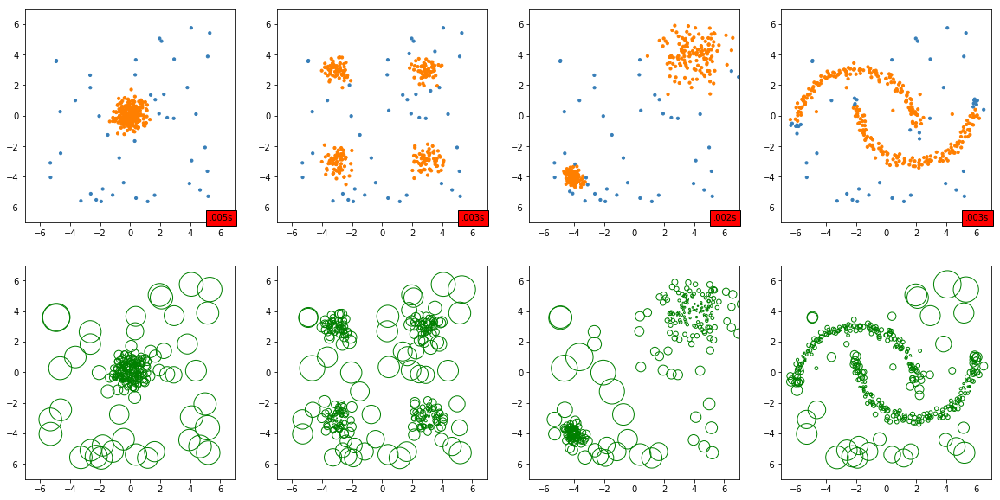

In [74]:
# Setup the LOF
algorithm = sklearn.neighbors.LocalOutlierFactor(n_neighbors=30, contamination=outliers_fraction)

plt.figure(figsize=(20, 10))
for i in range(len(X_wnoise)):
    plt.subplot(2,4,i+1)
    
    t0 = time.time()
    algorithm.fit(X_wnoise[i])
    t1 = time.time()
    
    y_pred = algorithm.fit_predict(X_wnoise[i])
    
    colors = np.array(['#377eb8', '#ff7f00'])
    plt.scatter(X_wnoise[i][:, 0], X_wnoise[i][:, 1], s=10, color=colors[(y_pred + 1) // 2])
    
    plt.xlim(-7, 7)
    plt.ylim(-7, 7)
    plt.text(.99, .01, ('%.3fs' % (t1 - t0)).lstrip('0'), transform=plt.gca().transAxes, size=10, horizontalalignment='right',bbox=dict(facecolor='red'))
    
    #Below Plot
    plt.subplot(2,4,i+5)
    outlierFactors = algorithm.negative_outlier_factor_
    radius = (outlierFactors.max() - outlierFactors)/(outlierFactors.max() - outlierFactors.min())
    plt.scatter(X_wnoise[i][:,0], X_wnoise[i][:,1], s=1000*radius, edgecolors='g', facecolors='none')
    
    plt.xlim(-7, 7)
    plt.ylim(-7, 7)
    
    


# Novelty Detection

In this case, the training dataset is clean (contains only inliers). Hence nonoise variables will be used. The goal is to get the training data to fit a boundary and use the training results to tell if a new data point is an inlier or outlier. 

## Robust Covariance Method

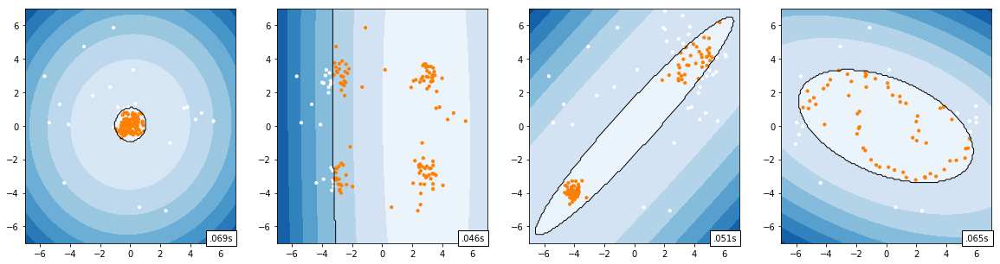

In [75]:
algorithm = sklearn.covariance.EllipticEnvelope(contamination = outliers_fraction)

colors = np.array(['#ffffff', '#ff7f00'])
plt.figure(figsize=(20, 5))
for i in range(len(X_test)):
    plt.subplot(1,4,i+1)
    
    t0 = time.time()
    algorithm.fit(X_nonoise[i])
    t1 = time.time()
    
    y_pred = algorithm.predict(X_test[i])

    boundary = algorithm.predict(np.c_[xx.ravel(), yy.ravel()])
    boundary = boundary.reshape(xx.shape)
    plt.contour(xx, yy, boundary, levels=[0], linewidths=1, colors='#000000')
    
    decision = algorithm.decision_function(np.c_[xx.ravel(), yy.ravel()])
    decision = decision.reshape(xx.shape)
    plt.contourf(xx, yy, decision, cmap=plt.cm.Blues_r)

    plt.scatter(X_test[i][:, 0], X_test[i][:, 1], s=10, color=colors[(y_pred + 1) // 2])
    
    plt.xlim(-7, 7)
    plt.ylim(-7, 7)
    plt.text(.99, .01, ('%.3fs' % (t1 - t0)).lstrip('0'), transform=plt.gca().transAxes, size=10, horizontalalignment='right',bbox=dict(facecolor='white'))

## One-Class Support Vector Machine (SVM)

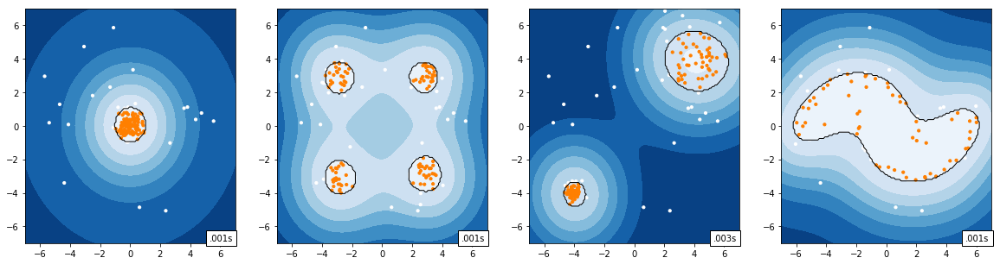

In [76]:
algorithm = sklearn.svm.OneClassSVM(nu=outliers_fraction, kernel="rbf", gamma=0.1)

plt.figure(figsize=(20, 5))
for i in range(len(X_test)):
    plt.subplot(1,4,i+1)
    
    t0 = time.time()
    algorithm.fit(X_nonoise[i])
    t1 = time.time()
    
    y_pred = algorithm.predict(X_test[i])

    boundary = algorithm.predict(np.c_[xx.ravel(), yy.ravel()])
    boundary = boundary.reshape(xx.shape)
    plt.contour(xx, yy, boundary, levels=[0], linewidths=1, colors='#000000')
    
    decision = algorithm.decision_function(np.c_[xx.ravel(), yy.ravel()])
    decision = decision.reshape(xx.shape)
    plt.contourf(xx, yy, decision, cmap=plt.cm.Blues_r)

    plt.scatter(X_test[i][:, 0], X_test[i][:, 1], s=10, color=colors[(y_pred + 1) // 2])
    
    plt.xlim(-7, 7)
    plt.ylim(-7, 7)
    plt.text(.99, .01, ('%.3fs' % (t1 - t0)).lstrip('0'), transform=plt.gca().transAxes, size=10, horizontalalignment='right',bbox=dict(facecolor='white'))

## Isolation Forest

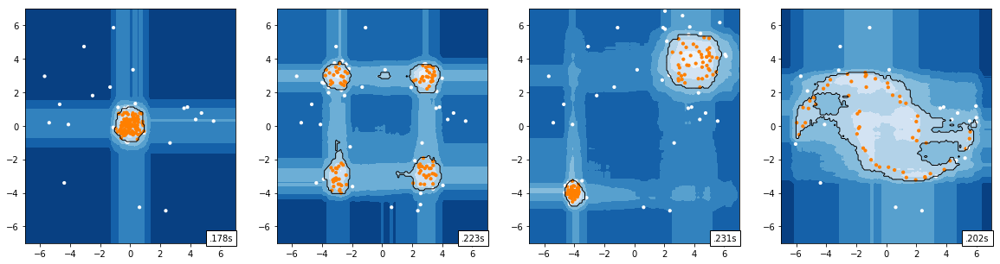

In [77]:
algorithm = sklearn.ensemble.IsolationForest(contamination=outliers_fraction, behaviour="new")

plt.figure(figsize=(20, 5))
for i in range(len(X_test)):
    plt.subplot(1,4,i+1)
    
    t0 = time.time()
    algorithm.fit(X_nonoise[i])
    t1 = time.time()
    
    y_pred = algorithm.predict(X_test[i])

    boundary = algorithm.predict(np.c_[xx.ravel(), yy.ravel()])
    boundary = boundary.reshape(xx.shape)
    plt.contour(xx, yy, boundary, levels=[0], linewidths=1, colors='#000000')
    
    decision = algorithm.decision_function(np.c_[xx.ravel(), yy.ravel()])
    decision = decision.reshape(xx.shape)
    plt.contourf(xx, yy, decision, cmap=plt.cm.Blues_r)

    plt.scatter(X_test[i][:, 0], X_test[i][:, 1], s=10, color=colors[(y_pred + 1) // 2])
    
    plt.xlim(-7, 7)
    plt.ylim(-7, 7)
    plt.text(.99, .01, ('%.3fs' % (t1 - t0)).lstrip('0'), transform=plt.gca().transAxes, size=10, horizontalalignment='right',bbox=dict(facecolor='white'))

## Local Outlier Factor

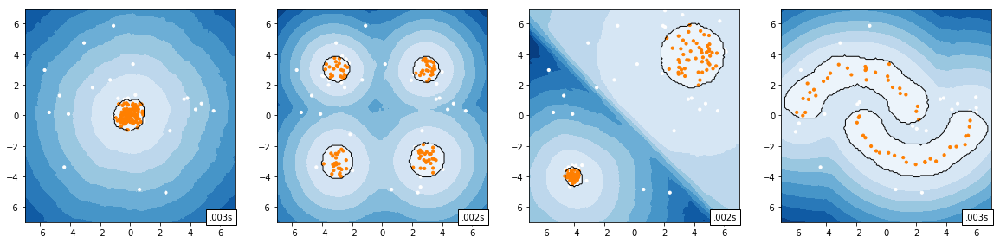

In [78]:
algorithm = sklearn.neighbors.LocalOutlierFactor(contamination=outliers_fraction, novelty = True, n_neighbors=30)

plt.figure(figsize=(20, 10))
for i in range(len(X_wnoise)):
    plt.subplot(2,4,i+1)
    
    t0 = time.time()
    algorithm.fit(X_nonoise[i])
    t1 = time.time()
    
    y_pred = algorithm.predict(X_test[i])
    
    boundary = algorithm.predict(np.c_[xx.ravel(), yy.ravel()])
    boundary = boundary.reshape(xx.shape)
    plt.contour(xx, yy, boundary, levels=[0], linewidths=1, colors='#000000')
    
    decision = algorithm.decision_function(np.c_[xx.ravel(), yy.ravel()])
    decision = decision.reshape(xx.shape)
    plt.contourf(xx, yy, decision, cmap=plt.cm.Blues_r)

    plt.scatter(X_test[i][:, 0], X_test[i][:, 1], s=10, color=colors[(y_pred + 1) // 2])
    
    plt.xlim(-7, 7)
    plt.ylim(-7, 7)
    plt.text(.99, .01, ('%.3fs' % (t1 - t0)).lstrip('0'), transform=plt.gca().transAxes, size=10, horizontalalignment='right',bbox=dict(facecolor='white'))
  
    # Below Plot
    #plt.subplot(2,4,i+5)
    #outlierFactors = algorithm.negative_outlier_factor_
    #radius = (outlierFactors.max() - outlierFactors)/(outlierFactors.max() - outlierFactors.min())
    #plt.scatter(X_nonoise[i][:,0], X_nonoise[i][:,1], s=1000*radius, edgecolors='g', facecolors='none')
    #plt.xlim(-7, 7)
    #plt.ylim(-7, 7)

# Application of Anomaly Detection: Fraud Detection

# Anomaly Detection

# Application of Anomaly Detection: Fraud Detection

The datasets contains transactions made by credit cards in September 2013 by european cardholders. 
It contains only numerical input variables which are the result of a PCA transformation. Unfortunately, due to confidentiality issues, the original features were not provided. Features V1, V2, ... V28 are the principal components obtained with PCA, the only features which have not been transformed with PCA are 'Time' and 'Amount'. Feature 'Time' contains the seconds elapsed between each transaction and the first transaction in the dataset. The feature 'Amount' is the transaction Amount. Feature 'Class' is the response variable and it takes value 1 in case of fraud and 0 otherwise.

In [79]:
# from https://www.kaggle.com/mlg-ulb/creditcardfraud
data = pd.read_csv('creditcard.csv',sep=',')

print(data.columns)

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')


In [80]:
data.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,...,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


# Exploratory analysis

In [81]:
data.shape

(284807, 31)

In [82]:
data.isnull().values.any()

False

In [83]:
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


Determine the number of fraud and valid transactions in the entire dataset.

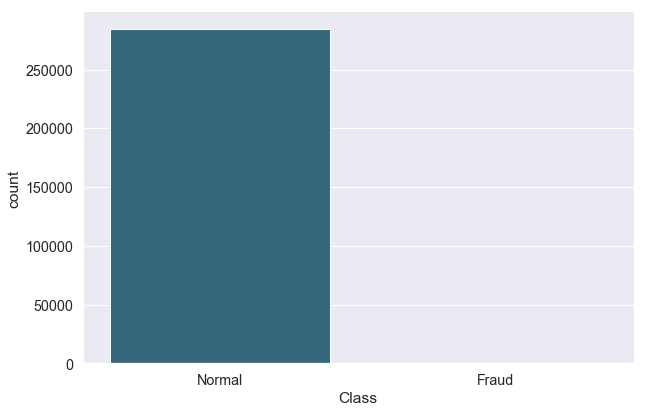

In [84]:
import seaborn as sns
sns.set(style="darkgrid")
sns.set(font_scale=1.3)
g=sns.catplot(x="Class", data=data, kind="count", height=6, aspect=1.5, palette="PuBuGn_d")
(g.set_xticklabels(["Normal", "Fraud"]))
plt.show();

There are 492 frauds out of 284807 transactions the dataset is highly unbalance.The frauds class account for 0.17% of all transactions  

In [85]:
Fraud = data[data['Class']==1]
Normal = data[data['Class']==0]

In [86]:
Fraud.shape

(492, 31)

In [87]:
Normal.shape

(284315, 31)

How different are the amount of money used in different transaction classes?

In [88]:
Fraud.Amount.describe()

count     492.000000
mean      122.211321
std       256.683288
min         0.000000
25%         1.000000
50%         9.250000
75%       105.890000
max      2125.870000
Name: Amount, dtype: float64

In [89]:
Normal.Amount.describe()

count    284315.000000
mean         88.291022
std         250.105092
min           0.000000
25%           5.650000
50%          22.000000
75%          77.050000
max       25691.160000
Name: Amount, dtype: float64

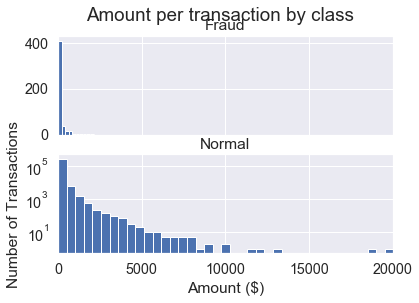

In [90]:
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
f.suptitle('Amount per transaction by class')
bins = 50
ax1.hist(Fraud.Amount, bins = 10)
ax1.set_title('Fraud')
ax2.hist(Normal.Amount, bins = bins)
ax2.set_title('Normal')
plt.xlabel('Amount ($)')
plt.ylabel('Number of Transactions')
plt.xlim((0, 20000))
plt.yscale('log')
plt.show();

The amount of money spent for both classes follow a pareto distribution with a wider variance for the normal class

Do fraudulent transactions occur more often during certain time frame  ?

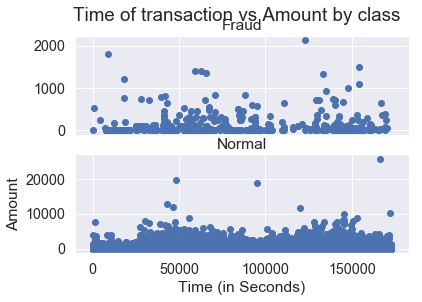

In [91]:
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
f.suptitle('Time of transaction vs Amount by class')
ax1.scatter(Fraud.Time, Fraud.Amount)
ax1.set_title('Fraud')
ax2.scatter(Normal.Time, Normal.Amount)
ax2.set_title('Normal')
plt.xlabel('Time (in Seconds)')
plt.ylabel('Amount')
plt.show()

In [92]:
#Training dataset is only 10% percent of the original dataset 
data_test= data.sample(frac = 0.1,random_state=1)
data_test.shape

(28481, 31)

Plot histogram of each feature: (most follow normal distribution/ multinormal nistribution)

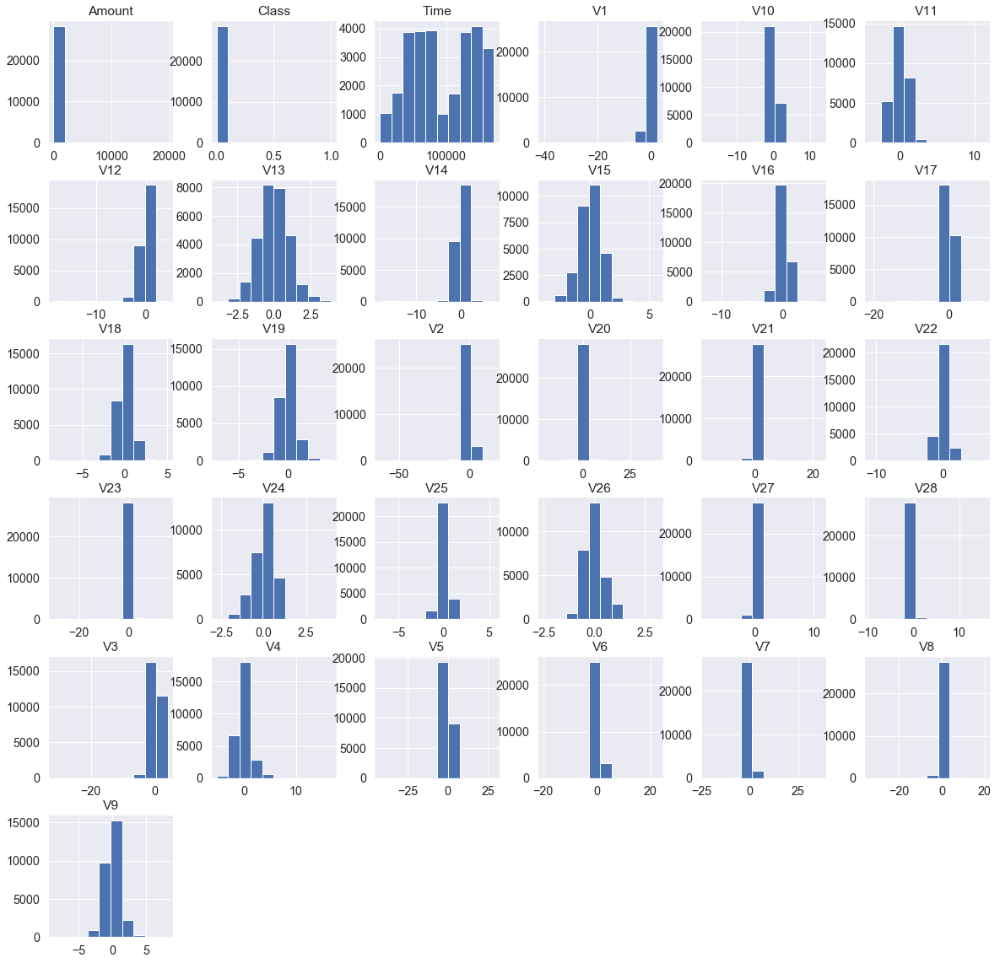

In [93]:
data_test.hist(figsize=(20,20))
plt.show()

In [94]:
#Now let us print the outlier fraction and no of Fraud and Valid Transaction cases
Fraud = data_test[data_test['Class']==1]

Valid = data_test[data_test['Class']==0]

outlier_fraction = len(Fraud)/float(len(Valid))
print(outlier_fraction*100)

print("Fraud Cases : {}".format(len(Fraud)))

print("Valid Cases : {}".format(len(Valid)))

0.17234102419808667
Fraud Cases : 49
Valid Cases : 28432


Correlation Matrix : to extract relationships between variables 

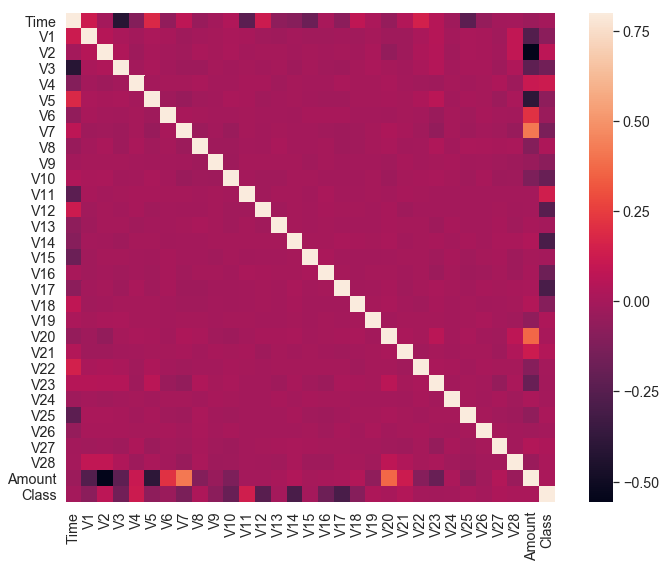

In [95]:
correlation_matrix = data_test.corr()

fig = plt.figure(figsize=(12,9))

sns.heatmap(correlation_matrix,vmax=0.8,square = True)

plt.show()

The above correlation matrix shows Class, V14 AND V17 are strongly correlated and class is not strongly correlated with time or amount. 
Also the V1 to V28 PCA components have no correlation to each other.

In [96]:
columns = data_test.columns.tolist()
# Filter the columns to remove data we do not want 
columns = [c for c in columns if c not in ["Class"]]
# Store the variable we are predicting 
target = "Class"
# Define a random state 
state = np.random.RandomState(42)
X = data_test[columns]
Y = data_test[target]
X_outliers = state.uniform(low=0, high=1, size=(X.shape[0], X.shape[1]))
# Print the shapes of X & Y
print(X.shape)
print(Y.shape)

(28481, 30)
(28481,)


Model Prediction
The types of algorithms we are going to use to try to do anomaly detection on this dataset are as follows:
 1. Covariance Elliptic Envelope:
 
 2. One Class Support Vector Machine:
 
 The algorithm learns a soft boundary in order to cluster the normal data instances using the training set, and then, using the testing instance, it tunes itself to identify the abnormalities that fall outside the learned region.
Depending on the use case, the output of an anomaly detector could be numeric scalar values for filtering on domain-specific thresholds or textual labels (such as binary/multi labels).

 3. Isolation Forest:
 
 The Isolation Forest algorithm isolates observations by randomly selecting a feature and then randomly selecting a split value between the maximum and minimum values of the selected feature. The logic argument goes: isolating anomaly observations is easier because only a few conditions are needed to separate those cases from the normal observations. On the other hand, isolating normal observations require more conditions. Therefore, an anomaly score can be calculated as the number of conditions required to separate a given observation.
 
 The way that the algorithm constructs the separation is by first creating isolation trees, or random decision trees. Then, the score is calculated as the path length to isolate the observation.
The algorithm learns a soft boundary in order to cluster the normal data instances using the training set, and then, using the testing instance, it tunes itself to identify the abnormalities that fall outside the learned region.
Depending on the use case, the output of an anomaly detector could be numeric scalar values for filtering on domain-specific thresholds or textual labels (such as binary/multi labels).

 4. Local Outlier Forest
 Local Outlier Factor: an unsupervised outlier detection method which computes the local density deviation of a given data point with respect to its neighbors. It considers as outlier samples that have a substantially lower density than their neighbors.The number of neighbors considered, (parameter n_neighbors) is typically chosen 1) greater than the minimum number of objects a cluster has to contain, so that other objects can be local outliers relative to this cluster, and 2) smaller than the maximum number of close by objects that can potentially be local outliers. In practice, such informations are generally not available, and taking n_neighbors=20 appears to work well in general.
 

In [97]:
classifiers = {
    "Covariance Elliptic Envelope":EllipticEnvelope(contamination=outlier_fraction),
    
    "Support Vector Machine":OneClassSVM(kernel='rbf', degree=3, gamma=0.1,nu=0.05, 
                                         max_iter=-1, random_state=state),
    "Isolation Forest":IsolationForest(n_estimators=100, max_samples=len(X), 
                                       contamination=outlier_fraction,random_state=state, verbose=0),
    "Local Outlier Factor":LocalOutlierFactor(n_neighbors=20, algorithm='auto', 
                                              leaf_size=30, metric='minkowski',
                                              p=2, metric_params=None, contamination=outlier_fraction)
}

Given the class imbalance ratio, we measure the accuracy using the Area Under the Precision-Recall Curve (AUPRC). Confusion matrix accuracy is not meaningful for unbalanced classification.

In [103]:
X = data_test[columns]
n_outliers = len(Fraud)
# ax=plt.figure(figsize=(20, 10))
for j, (clf_name,clf) in enumerate(classifiers.items()):
    #Fit the data and tag outliers
    if clf_name == "Local Outlier Factor":
        y_pred = clf.fit_predict(X)
        scores_prediction = clf.negative_outlier_factor_
        y_scores = scores_prediction
    elif clf_name == "Support Vector Machine":
        clf.fit(X)
        y_pred = clf.predict(X)
        y_scores = clf.decision_function(X)
    elif clf_name == "Covariance Elliptic Envelope":
        clf.fit(X)
        y_pred = clf.predict(X)
        y_scores = clf.decision_function(X)
    else:    
        clf.fit(X)
        scores_prediction = clf.decision_function(X)
        y_pred = clf.predict(X)
        y_scores = scores_prediction

    precision, recall, th = precision_recall_curve(Y, -y_scores)
#     aucpr_score = np.trapz(recall, precision)
    # calculate average precision score
    ap = average_precision_score(Y, -y_scores)
#     plt.plot(recall, precision, label="{} AUCPR = {:.4f}".format(clf_name, ap))
    y_pred[y_pred == 1] = 0
    y_pred[y_pred == -1] = 1
    n_errors = (y_pred != Y).sum()
    #Run Classification Metrics
    print("{}: {}".format(clf_name,n_errors))
    print("Accuracy Score :")
    print(accuracy_score(Y,y_pred))
    print("Classification Report :")
    print(classification_report(Y,y_pred))
# Set common labels
# plt.xlabel('Recall')
# plt.ylabel('Precision')  
# plt.legend()
# plt.show()

Covariance Elliptic Envelope: 33
Accuracy Score :
0.9988413328183702
Classification Report :
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     28432
           1       0.66      0.67      0.67        49

   micro avg       1.00      1.00      1.00     28481
   macro avg       0.83      0.84      0.83     28481
weighted avg       1.00      1.00      1.00     28481

Support Vector Machine: 1389
Accuracy Score :
0.9512306449913978
Classification Report :
              precision    recall  f1-score   support

           0       1.00      0.95      0.97     28432
           1       0.03      0.86      0.06        49

   micro avg       0.95      0.95      0.95     28481
   macro avg       0.51      0.90      0.52     28481
weighted avg       1.00      0.95      0.97     28481

Isolation Forest: 45
Accuracy Score :
0.9984199992977775
Classification Report :
              precision    recall  f1-score   support

           0       1.00     

# Isolation Forest detected 71 errors versus Local Outlier Factor detecting 97 errors vs Covariance Elliptic Envelope detecting 99 erros vs. SVM detecting 8516 errors.
# Overall Isolation Forest Method performed much better in determining the fraud cases.We can also improve on this accuracy by increasing the sample size or use deep learning algorithms however at the cost of computational expense.We can also use complex anomaly detection models to get better accuracy in determining more fraudulent cases

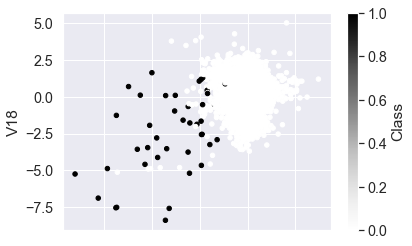

In [99]:
#plt.scatter(orig_data_test['Time'],orig_data_test['V23'],color=orig_data_test["Class"])
data_test.plot.scatter(x='V14', y='V18', c='Class');

Covariance Elliptic Envelope: 33
Accuracy Score :
0.9988413328183702
Classification Report :
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     28432
           1       0.66      0.67      0.67        49

   micro avg       1.00      1.00      1.00     28481
   macro avg       0.83      0.84      0.83     28481
weighted avg       1.00      1.00      1.00     28481

Support Vector Machine: 1389
Accuracy Score :
0.9512306449913978
Classification Report :
              precision    recall  f1-score   support

           0       1.00      0.95      0.97     28432
           1       0.03      0.86      0.06        49

   micro avg       0.95      0.95      0.95     28481
   macro avg       0.51      0.90      0.52     28481
weighted avg       1.00      0.95      0.97     28481

Isolation Forest: 47
Accuracy Score :
0.9983497770443454
Classification Report :
              precision    recall  f1-score   support

           0       1.00     

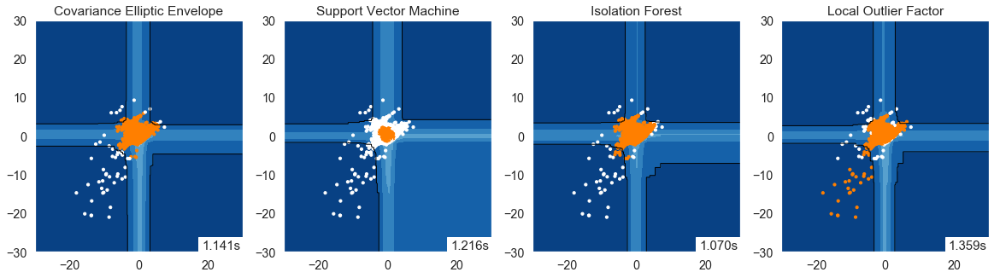

In [100]:
columns = ["V14","V17"]
X = data_test[columns]
minX= X["V14"].min()
maxX= X["V14"].max()
minY= X["V17"].min()
maxY= X["V17"].max()
n_outliers = len(Fraud)
X_test = np.array([np.r_[X]])

algorithm = sklearn.ensemble.IsolationForest(contamination=outlier_fraction, behaviour="new")
#xx, yy = np.meshgrid(np.linspace(minX, maxX, 150), np.linspace(minY, maxY, 150))
xx, yy = np.meshgrid(np.linspace(-30, 30, 500), np.linspace(-30, 30, 500))


plt.figure(figsize=(20, 5))
for j, (clf_name,clf) in enumerate(classifiers.items()):
    ax = plt.subplot(1,4,j+1)
    ax.set_title(clf_name)
    #Fit the data and tag outliers
    if clf_name == "Local Outlier Factor":
        y_pred = clf.fit_predict(X)
        scores_prediction = clf.negative_outlier_factor_
    elif clf_name == "Support Vector Machine":
        clf.fit(X)
        y_pred = clf.predict(X)
    else:    
        clf.fit(X)
        scores_prediction = clf.decision_function(X)
        y_pred = clf.predict(X)
    for i in range(len(X_test)):
        t0 = time.time()
        algorithm.fit(X_test[i])
        t1 = time.time()
        Boundary = algorithm.predict(np.c_[xx.ravel(), yy.ravel()])
        Boundary = Boundary.reshape(xx.shape)
        plt.contour(xx, yy, Boundary, levels=[0], linewidths=1, colors='#000000')
        decision = algorithm.decision_function(np.c_[xx.ravel(), yy.ravel()])
        decision = decision.reshape(xx.shape)
        plt.contourf(xx, yy, decision, cmap=plt.cm.Blues_r)
        plt.scatter(X_test[i][:, 0], X_test[i][:, 1], s=10, color=colors[(y_pred + 1) // 2])
        plt.text(.99, .01, ('%.3fs' % (t1 - t0)).lstrip('0'), transform=plt.gca().transAxes, size=15, horizontalalignment='right',bbox=dict(facecolor='white'))
    y_pred[y_pred == 1] = 0
    y_pred[y_pred == -1] = 1
    n_errors = (y_pred != Y).sum()
    #Run Classification Metrics
    print("{}: {}".format(clf_name,n_errors))
    print("Accuracy Score :")
    print(accuracy_score(Y,y_pred))
    print("Classification Report :")
    print(classification_report(Y,y_pred))

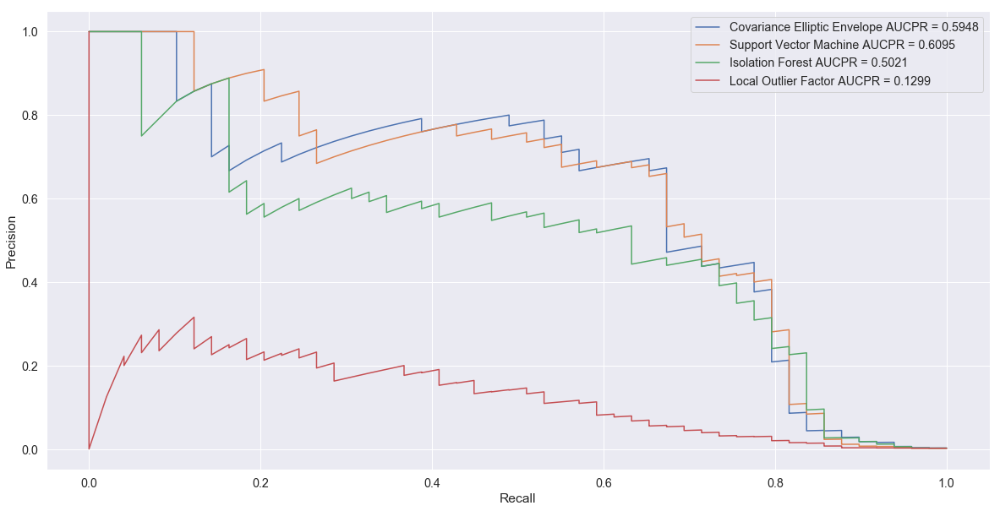

In [102]:
ax=plt.figure(figsize=(20, 10))
for j, (clf_name,clf) in enumerate(classifiers.items()):
    #Fit the data and tag outliers
    if clf_name == "Local Outlier Factor":
        y_pred = clf.fit_predict(X)
        scores_prediction = clf.negative_outlier_factor_
        y_scores = scores_prediction
    elif clf_name == "Support Vector Machine":
        clf.fit(X)
        y_pred = clf.predict(X)
        y_scores = clf.decision_function(X)
    elif clf_name == "Covariance Elliptic Envelope":
        clf.fit(X)
        y_pred = clf.predict(X)
        y_scores = clf.decision_function(X)
    else:    
        clf.fit(X)
        scores_prediction = clf.decision_function(X)
        y_pred = clf.predict(X)
        y_scores = scores_prediction

    precision, recall, th = precision_recall_curve(Y, -y_scores)
    aucpr_score = np.trapz(recall, precision)
    ap = average_precision_score(Y, -y_scores)
    plt.plot(recall, precision, label="{} AUCPR = {:.4f}".format(clf_name, ap))

    
# Set common labels
plt.xlabel('Recall')
plt.ylabel('Precision')  
plt.legend()
plt.show()